# ***Generating the environment for processing***



---



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#changing the processing space:
%cd /content/drive/MyDrive/Prediction_hyperspectral/Hyperspectral_data/Full_hridaypur

/content/drive/MyDrive/Prediction_hyperspectral/Hyperspectral_data/Full_hridaypur


In [ ]:
%%capture
!pip install catboost
!pip install spectral

In [ ]:
#importing necessary libraries
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
from google.colab import files
from tensorflow import keras
from tensorflow.keras import layers
from catboost import CatBoostRegressor
import spectral

#import ML libraries
from xgboost import XGBRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.svm import SVR
from sklearn.ensemble import BaggingRegressor
from sklearn.exceptions import ConvergenceWarning
from sklearn.linear_model import ElasticNet
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF
import matplotlib.pyplot as plt

# ***Rescaling wisp  data to fit that of bayspec***





---



In [ ]:
# Function to upload and read file
# uploaded=files.upload() # Use this when the data is not uploaded into the same folder.

# Upload and read files
df_1 = pd.read_csv('X_Values_modified.csv')
df_2 = pd.read_csv('Y_Values.csv')
df_3 = pd.read_csv('Original_spectra_example.csv', header=None)
df_4 = pd.read_csv('Y_Values_with_standards.csv', header=0)

# Print shapes
print(f"Shape of X_Values: {df_1.shape}")
print(f"Shape of Y_Values: {df_2.shape}")
print(f"Shape of the OCIF wavelengths: {df_3.shape}")


Shape of X_Values: (34, 401)
Shape of Y_Values: (34, 34)
Shape of the OCIF wavelengths: (1, 95)


In [ ]:
# Convert column names of df_1 to float type for interpolation
df_1.columns = df_1.columns.astype(float)

# Transpose df_1 for easier manipulation
df_1 = df_1.T

# Convert df_3 to a flat array of wavelengths
wavelengths = df_3.values.flatten()

# Reindex df_1 to the new wavelengths, using interpolation to fill missing values
df_1_interp = df_1.reindex(df_1.index.union(wavelengths)).interpolate(method='index').loc[wavelengths]

# Transpose df_1_interp back to original form
df_1_interp = df_1_interp.T

# Print the interpolated DataFrame
# print(df_1_interp)


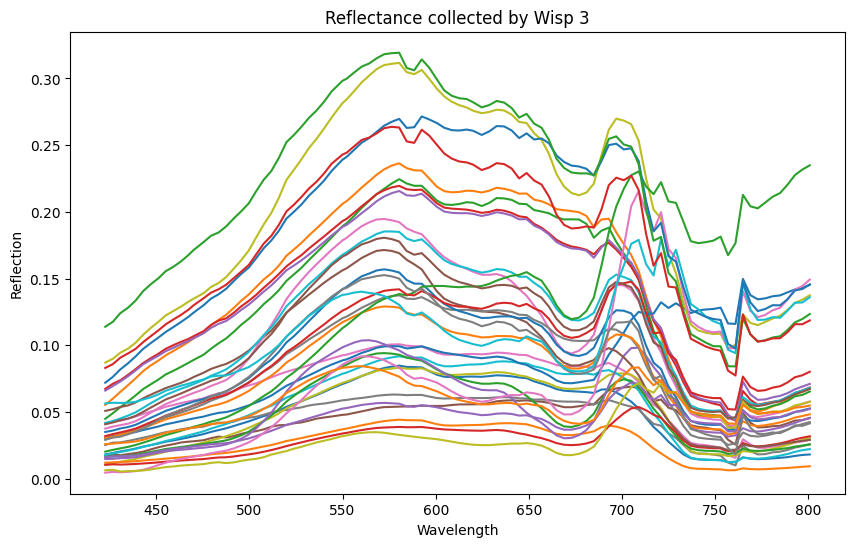

In [ ]:
# Import the required library
import matplotlib.pyplot as plt

# Create a new figure
plt.figure(figsize=(10,6))

# Plot the data
for i in range(len(df_1_interp)):
    plt.plot(df_1_interp.columns, df_1_interp.iloc[i, :])

# Add a title
plt.title('Reflectance collected by Wisp 3')

# Add labels
plt.xlabel('Wavelength')
plt.ylabel('Reflection')

# Show the plot
plt.show()


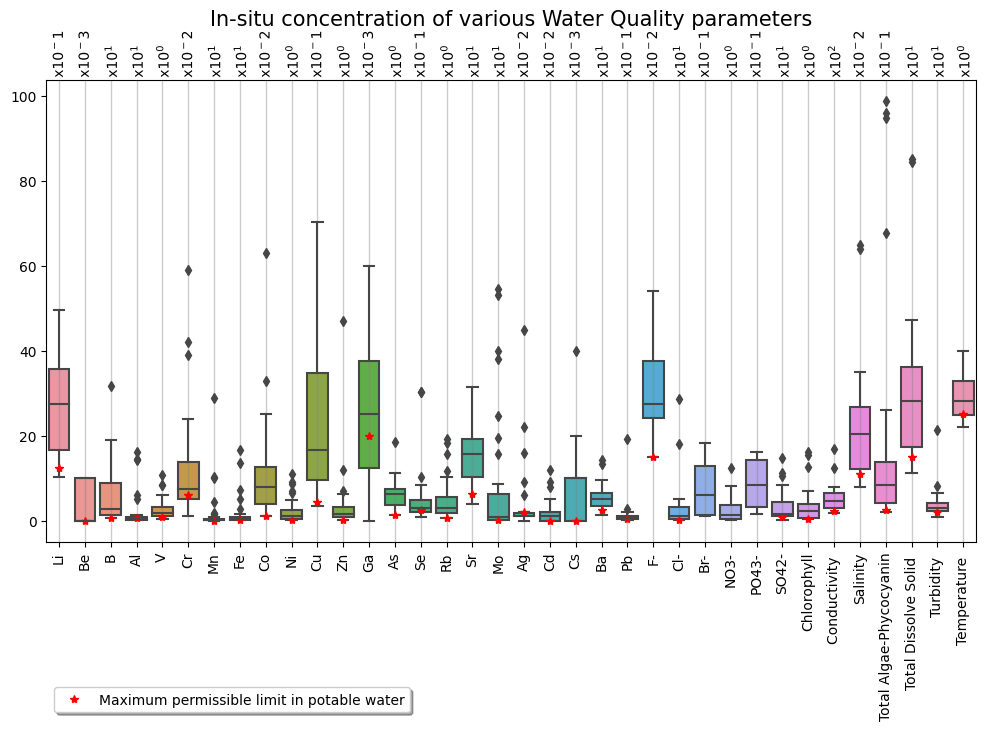

In [ ]:
# Import the required libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.patheffects as path_effects

# Remove the first row from the DataFrame
df = df_4.iloc[1:, :]

# Convert the data to numeric type
df = df.apply(pd.to_numeric, errors='coerce')

# Select the data from the 3rd column onwards
df = df.iloc[:, 2:]

# Scale the data
scaled_df = df.copy()
multipliers = []
for column in df.columns:
    # Calculate the multiplier as a power of 10
    multiplier = 10 ** np.floor(np.log10(df[column].max() / 10))
    # Scale the column data
    scaled_df[column] = df[column] / multiplier
    # Store the multiplier for later use
    multipliers.append(multiplier)

# Create a box plot for each column
plt.figure(figsize=(12, 6))
sns.boxplot(data=scaled_df)

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Add the scaling multiplier as text annotations at the top of the box plot
for i, (column, multiplier) in enumerate(zip(scaled_df.columns, multipliers)):
    # Calculate the power of 10
    power = int(np.log10(multiplier))
    # Create the text annotation with the power as a superscript
    text = plt.text(i, 105, f'x10$^{power}$', ha='center', rotation=90, fontsize=10)
    # Add a white outline to the text to make it more readable
    text.set_path_effects([path_effects.Stroke(linewidth=3, foreground='white'), path_effects.Normal()])

# Plot the second row as a red line in every box plot
second_row = scaled_df.iloc[1, :]
plt.plot(range(len(scaled_df.columns)), second_row, 'r*', label='Maximum permissible limit in potable water')

# Add a title with adjusted position
plt.title('In-situ concentration of various Water Quality parameters', y=1.1, fontsize = 15)

# Add a vertical grid to the plot
plt.grid(axis='x', color='gray', linestyle='-', linewidth=1, alpha = 0.4)

# Add a legend at the bottom
plt.legend(loc='upper center', bbox_to_anchor=(0.2, -0.3), fancybox=True, shadow=True, ncol=5)

# Show the plot
plt.show()


# ***Training and saving ML model***





---



In [ ]:
# create a dataframe to store the greatest r2 scores obtained for each element using all algorithms

r_df = pd.DataFrame(columns=['model name', 'Li', 'B', 'Al', 'V', 'Cr', 'Mn', 'Fe',
                             'Co', 'Ni', 'Cu', 'Zn', 'Ga', 'As', 'Se', 'Rb', 'Sr',
                             'Mo', 'Ag', 'Cd', 'Cs', 'Ba', 'Pb', 'F-', 'Cl-', 'SO42-',
                             'Chlorophyll', 'Conductivity', 'Salinity', 'Total Algae-Phycocyanin',
                             'Total Dissolve Solid', 'Turbidity', 'Temperature'])

In [ ]:
# Import the necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from catboost import CatBoostRegressor
from sklearn.metrics import r2_score
import pickle

# Define a function to train a CatBoost model and save it
def train_and_save_catb(reflectivities, column, model_name):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(reflectivities, column, test_size=0.2, random_state=42)

    # Standardize the input features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Train a CatBoost model
    model = CatBoostRegressor(iterations=100, learning_rate=0.1, loss_function='RMSE')
    model.fit(X_train_scaled, y_train, verbose=100)

    # Save the model and the scaler to a file
    pickle.dump((model, scaler), open(model_name, 'wb'))

    # Make predictions on the test set
    y_pred = model.predict(X_test_scaled)
    r2 = r2_score(y_test, y_pred)

    return y_pred, y_test, r2

# Define the input features
reflectivities = df_1_interp.iloc[:, :]

# Loop over the columns in df_2
for col in df_2.columns[2:]:
    try:
        # Replace 'BDL' values with NaN in y_data
        column = df_2[col].replace('BDL', np.nan).astype(float)

        # Calculate Pearson correlation between each column in reflectivities and column
        pearson_values = []
        for reflectivity_col in reflectivities.columns:
            pearson_value, _ = pearsonr(reflectivities[reflectivity_col], column)
            pearson_values.append(pearson_value)

        # Create a Series with the Pearson correlation values and column names
        pearson_series = pd.Series(pearson_values, index=reflectivities.columns)

        # Find the optimal Pearson correlation threshold
        r2_scores = pd.DataFrame()

        # Loop over a range of Pearson correlation thresholds
        for threshold in np.arange(-0.4, 1.0, 0.1):
            selected_columns = reflectivities.columns[pearson_series > threshold]

            if len(selected_columns) == 0:
                continue

            X_selected = reflectivities[selected_columns]
            y_pred, y_test, r2 = train_and_save_catb(X_selected, column, f'catb_{col}.pkl')

            r2_scores = pd.concat([r2_scores, pd.DataFrame({'Threshold': [threshold], 'R-squared Score': [r2]})], ignore_index=True)

        # Find the threshold that yields the maximum R-squared score
        max_r2_index = r2_scores['R-squared Score'].idxmax()
        max_r2_threshold = r2_scores.loc[max_r2_index, 'Threshold']
        max_r2_score = r2_scores.loc[max_r2_index, 'R-squared Score']

        # Print the results for the current column
        print(f"Element: {col}")
        print(f"Max R-squared Score: {max_r2_score}")
        print(f"Threshold: {max_r2_threshold}")
        print(f"Model saved as: catb_{col}.pkl")
        print()

    except:
        print(f"Error processing column: {col}")


0:	learn: 1.1429438	total: 47.5ms	remaining: 4.7s
99:	learn: 0.2001515	total: 227ms	remaining: 0us
0:	learn: 1.1499915	total: 1.26ms	remaining: 124ms
99:	learn: 0.2434200	total: 86.5ms	remaining: 0us
0:	learn: 1.1582049	total: 971us	remaining: 96.2ms
99:	learn: 0.2400819	total: 84.3ms	remaining: 0us
0:	learn: 1.1532629	total: 2.13ms	remaining: 211ms
99:	learn: 0.2710173	total: 77.2ms	remaining: 0us
0:	learn: 1.1566656	total: 1.03ms	remaining: 102ms
99:	learn: 0.3074282	total: 78.1ms	remaining: 0us
Element: Li
Max R-squared Score: 0.31795186888116955
Threshold: -0.4
Model saved as: catb_Li.pkl

0:	learn: 66.8379452	total: 1.3ms	remaining: 128ms
99:	learn: 7.9703645	total: 96.2ms	remaining: 0us
0:	learn: 67.5116084	total: 795us	remaining: 78.8ms
99:	learn: 7.8966560	total: 92.3ms	remaining: 0us
0:	learn: 67.1086292	total: 983us	remaining: 97.3ms
99:	learn: 8.6583448	total: 87.1ms	remaining: 0us
0:	learn: 67.2258932	total: 2.08ms	remaining: 206ms
99:	learn: 9.9722170	total: 89.3ms	remaini

## ***Loading the  Bayspec Image data***

/usr/local/lib/python3.10/dist-packages/spectral/graphics/spypylab.py:796: UserWarning: Failed to create RectangleSelector object. Interactive pixel class labeling will be unavailable.
  warnings.warn(msg)


ImageView object:
  Display bands       :  [0, 1, 2]
  Interpolation       :  <default>
  RGB data limits     :
    R: [0.0, 1.0]
    G: [0.0, 1.0]
    B: [0.0, 1.0]

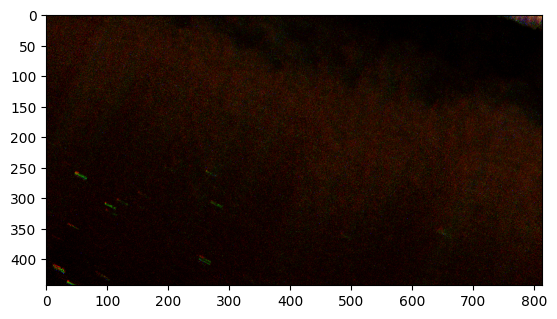

In [ ]:
# Load the hyperspectral data cube and its associated header
data_file = 'hridaypur_subset2'

# Specify the byte order of the data in the ENVI header file
header = spectral.envi.read_envi_header(data_file + '.hdr')
header['byte order'] = 0  # Replace 'value' with 0 or 1
spectral.envi.write_envi_header(data_file + '.hdr', header)

img = spectral.open_image(data_file + '.hdr')

# Select three bands to use for the false-color composite
red_band = 29
green_band = 19
blue_band = 9

# Extract the data from the selected bands
red_data = img.read_band(red_band).astype(np.float32)
green_data = img.read_band(green_band).astype(np.float32)
blue_data = img.read_band(blue_band).astype(np.float32)

# Normalize the data to the range [0, 1]
red_data /= np.max(red_data)
green_data /= np.max(green_data)
blue_data /= np.max(blue_data)

# Create the false-color composite image
false_color_img = np.stack([red_data, green_data, blue_data], axis=-1)

# Display the false-color composite image
spectral.imshow(false_color_img)

/usr/local/lib/python3.10/dist-packages/spectral/graphics/spypylab.py:796: UserWarning: Failed to create RectangleSelector object. Interactive pixel class labeling will be unavailable.
  warnings.warn(msg)


ImageView object:
  Display bands       :  [0, 1, 2]
  Interpolation       :  <default>
  RGB data limits     :
    R: [0.0, 1.0]
    G: [0.0, 1.0]
    B: [0.0, 1.0]

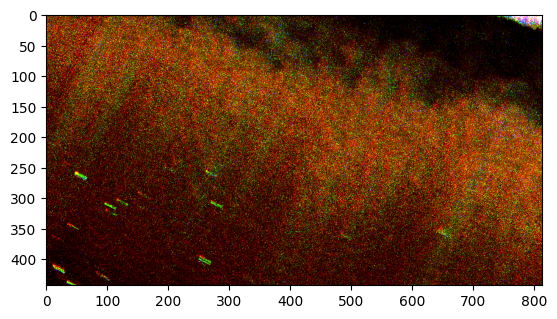

In [ ]:
# Specify the percentile to clip at
clip_percentile = 99

# Extract the data from the selected bands
red_data = img.read_band(red_band).astype(np.float32)
green_data = img.read_band(green_band).astype(np.float32)
blue_data = img.read_band(blue_band).astype(np.float32)

# Clip the data at the specified percentile
red_data = np.clip(red_data, 0, np.percentile(red_data, clip_percentile))
green_data = np.clip(green_data, 0, np.percentile(green_data, clip_percentile))
blue_data = np.clip(blue_data, 0, np.percentile(blue_data, clip_percentile))

# Normalize the data to the range [0, 1]
red_data /= np.max(red_data)
green_data /= np.max(green_data)
blue_data /= np.max(blue_data)

# Create the false-color composite image
false_color_img = np.stack([red_data, green_data, blue_data], axis=-1)

# Display the false-color composite image
spectral.imshow(false_color_img)


In [ ]:
'''# Print the number of bands
print(f'Number of bands: {img.shape[2]}')

# Print the wavelength values for each band
print('Wavelength values for each band:')
for i, band in enumerate(img.bands.centers):
    print(f'Band {i+1}: {band} nm')'''


"# Print the number of bands\nprint(f'Number of bands: {img.shape[2]}')\n\n# Print the wavelength values for each band\nprint('Wavelength values for each band:')\nfor i, band in enumerate(img.bands.centers):\n    print(f'Band {i+1}: {band} nm')"

In [ ]:
# Import the required libraries
import spectral
import numpy as np
import pandas as pd

# Get the list of wavelengths from df_3
wavelengths = df_3.iloc[0, :].values

# Get the list of wavelengths from the image
img_wavelengths = img.bands.centers

# Find the indices of the bands in the image that match the wavelengths in df_3
band_indices = [np.argmin(np.abs(np.array(img_wavelengths) - wavelength)) for wavelength in wavelengths]

# Extract the selected bands from the image
selected_bands = img.read_bands(band_indices)

# Save the selected bands to a new image file
spectral.envi.save_image('selected_bands.hdr', selected_bands, dtype='float32', interleave='bsq', byteorder='0', force='True')

print('Selected bands have been saved to selected_bands.hdr')


Selected bands have been saved to selected_bands.hdr


In [ ]:
'''# Print the list of bands that were extracted
for i, band_index in enumerate(band_indices):
    print(f'Band {i+1}: {img_wavelengths[band_index]} nm')'''


"# Print the list of bands that were extracted\nfor i, band_index in enumerate(band_indices):\n    print(f'Band {i+1}: {img_wavelengths[band_index]} nm')"

## ***Using the model on the Bayspec image to generate spatial map***

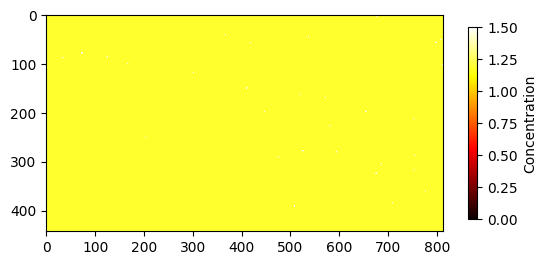

In [ ]:
import pickle

# Load the model and the scaler
model, scaler = pickle.load(open('catb_Chlorophyll.pkl', 'rb'))

# Select the bands
selected_bands_data = selected_bands

# Standardize the bands
scaler = StandardScaler()
scaler.fit(selected_bands_data.reshape(-1, selected_bands_data.shape[-1]))
selected_bands_data_scaled = scaler.transform(selected_bands_data.reshape(-1, selected_bands_data.shape[-1])).reshape(selected_bands_data.shape)

# Make predictions
predictions = model.predict(selected_bands_data_scaled.reshape(-1, selected_bands_data_scaled.shape[-1])).reshape(selected_bands_data_scaled.shape[:-1])




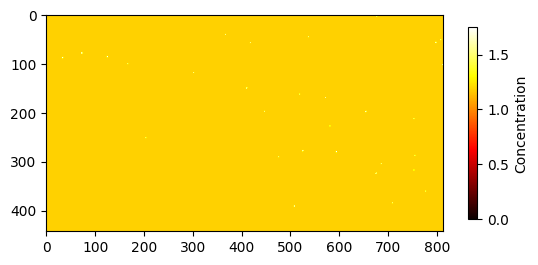

In [ ]:
import matplotlib.pyplot as plt

# Display the spatial map of concentration
plt.imshow(predictions, cmap='hot',vmin=0, vmax=1.75)
plt.colorbar(label='Concentration', shrink = 0.52)
plt.show()

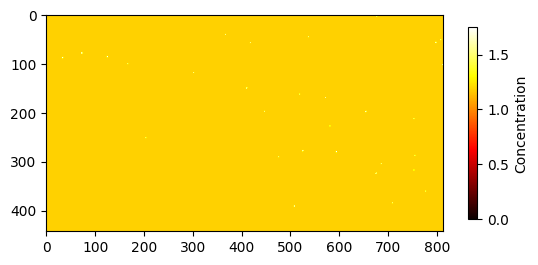

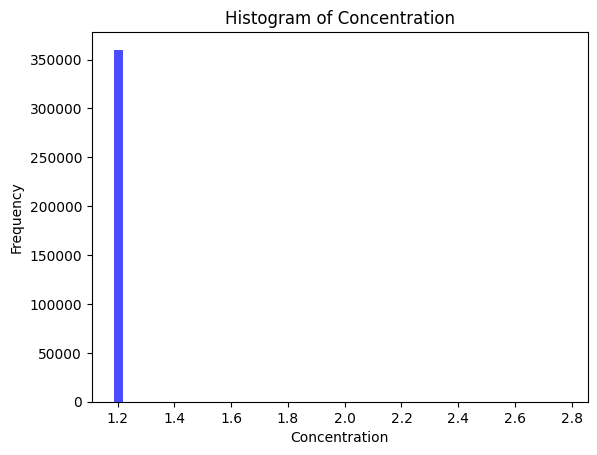

In [ ]:
import matplotlib.pyplot as plt

# Display the spatial map of concentration
plt.imshow(predictions, cmap='hot',vmin=0, vmax=1.75)
plt.colorbar(label='Concentration', shrink = 0.52)

# Add a histogram of the concentration values
plt.figure()  # Create a new figure for the histogram
plt.hist(predictions.ravel(), bins=50, color='blue', alpha=0.7)
plt.title('Histogram of Concentration')
plt.xlabel('Concentration')
plt.ylabel('Frequency')

plt.show()


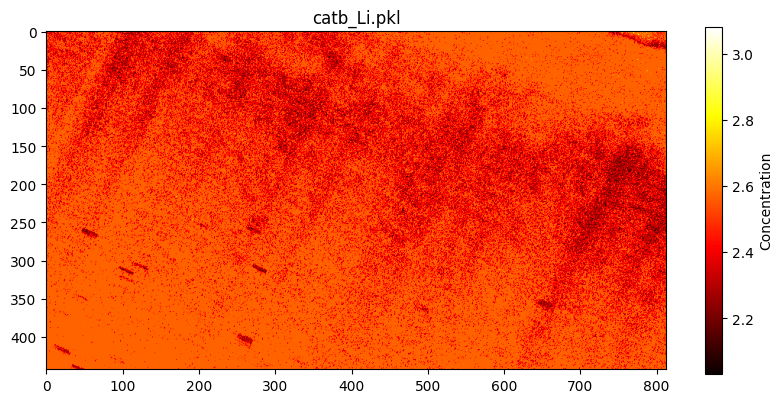

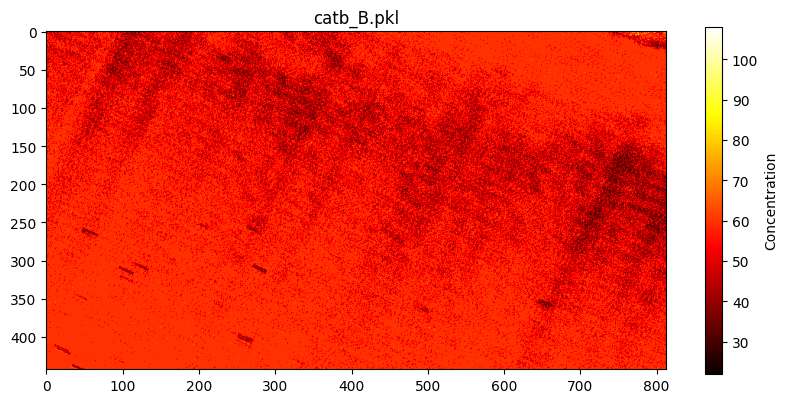

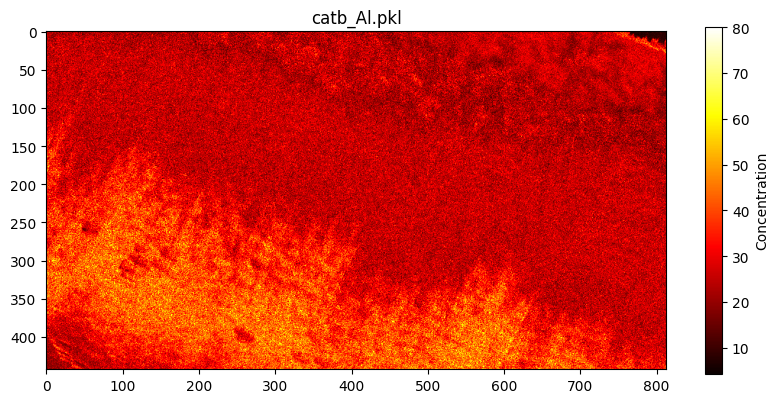

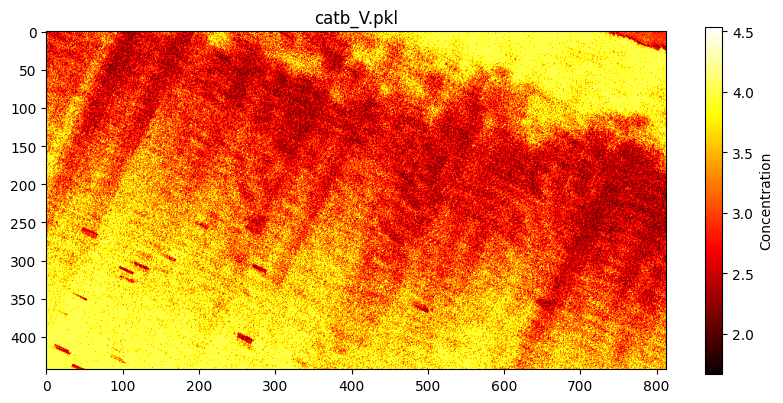

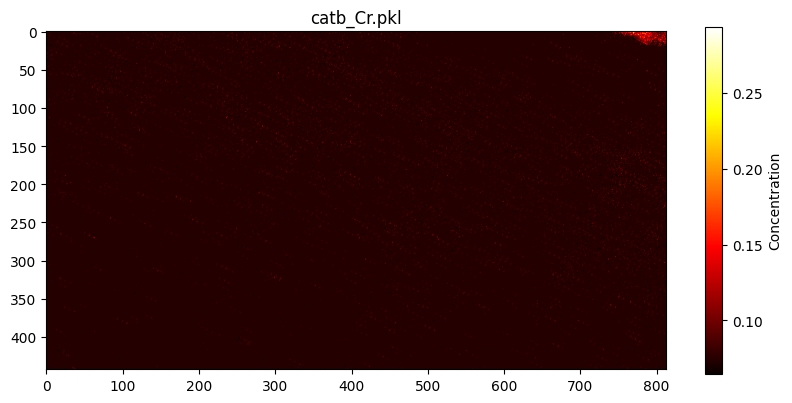

...

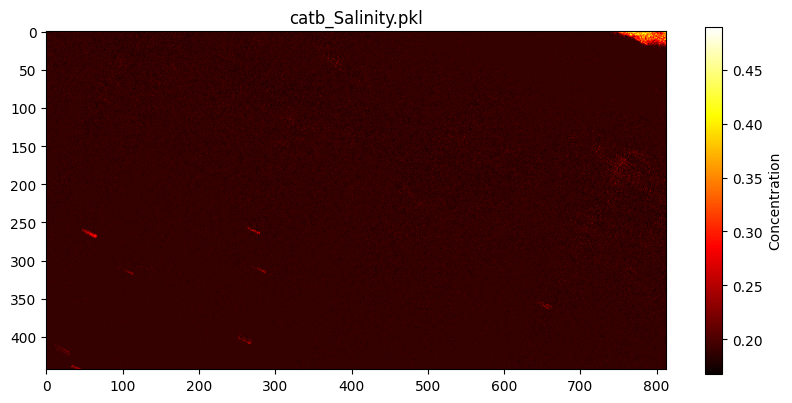

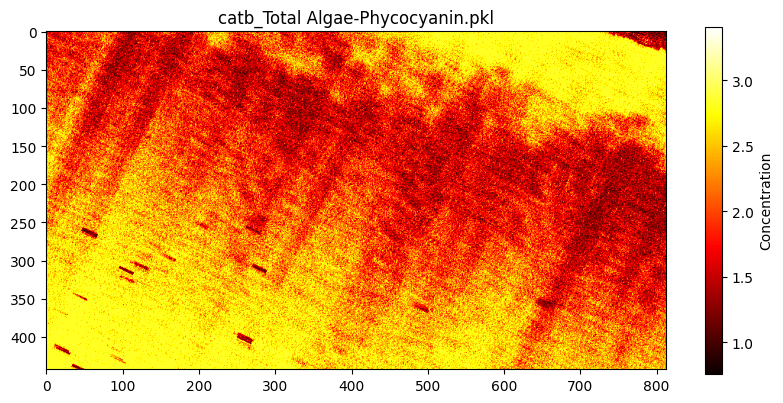

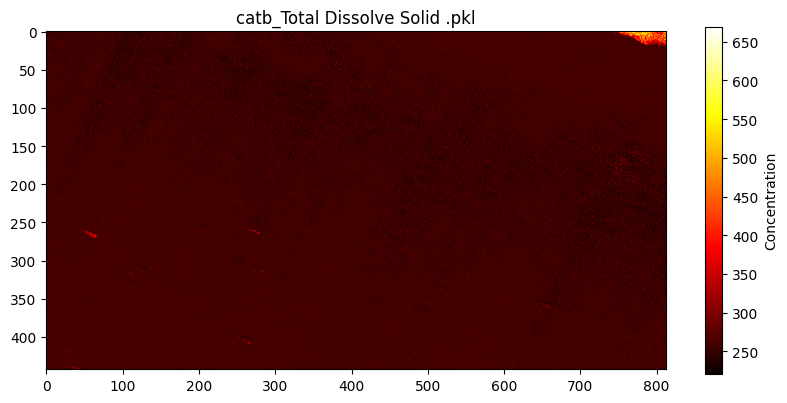

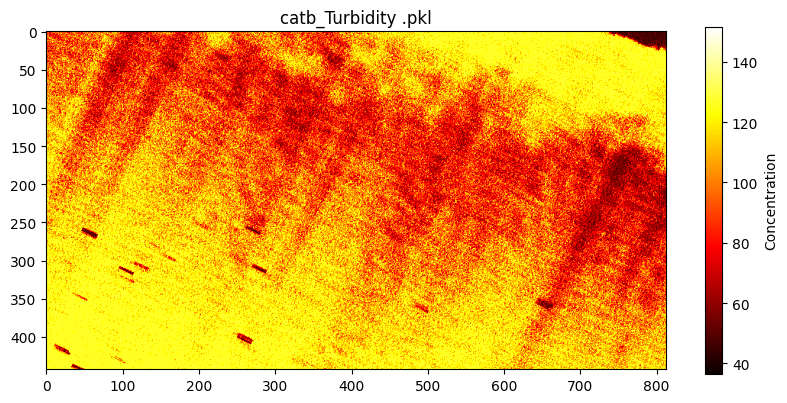

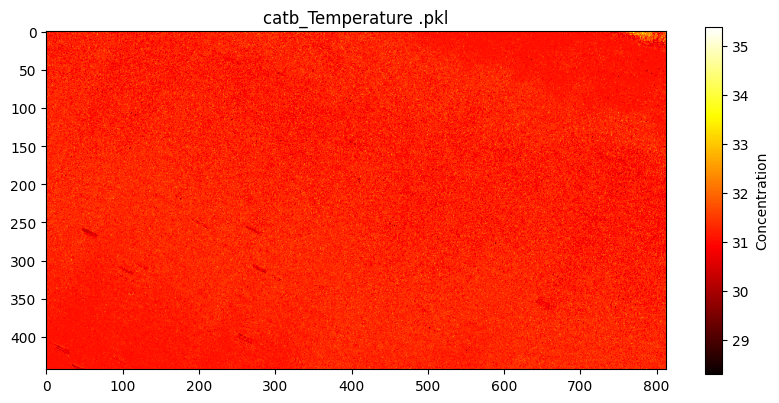

In [ ]:
import pickle
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import glob

# List of model files
model_files = glob.glob('*.pkl') # replace with your actual list of model files

# Loop over all model files
for model_file in model_files:
    # Load the model and the scaler
    model, scaler = pickle.load(open(model_file, 'rb'))

    # Standardize the bands
    scaler = StandardScaler()
    scaler.fit(selected_bands_data.reshape(-1, selected_bands_data.shape[-1]))
    selected_bands_data_scaled = scaler.transform(selected_bands_data.reshape(-1, selected_bands_data.shape[-1])).reshape(selected_bands_data.shape)

    # Make predictions
    predictions = model.predict(selected_bands_data_scaled.reshape(-1, selected_bands_data_scaled.shape[-1])).reshape(selected_bands_data_scaled.shape[:-1])

    # Display the spatial map of concentration
    plt.figure(figsize=(10, 10))
    plt.title(model_file)
    plt.imshow(predictions, cmap='hot') #,vmin=0, vmax=10
    plt.colorbar(label='Concentration', shrink=0.45)
    plt.show()
